# Coursework 1: Convolutional Neural Networks 
### Autograding
Part 1 of this coursework is autograded. This notebook comes with embedded tests which will verify that your implementations provide outputs with the appropriate types and shapes required for our hidden tests. You can run these same public tests through [LabTS](https://teaching.doc.ic.ac.uk/labts) when you have finished your work, to check that we get the same results when running these public tests.

Hidden tests will be ran after the submission deadline, and cannot be accessed :)

### Setting up working environment 

For this coursework you will need to train a large network, therefore we recommend you work with Google Colaboratory or Lab cluster, where you can access GPUs.

Please refer to the Intro lecture for getting set up on the various GPU options.

**To run the public tests within colab** you will need to copy the "tests" folder to the /content/ directory (this is the default working directory - you can also change directories with %cd). You may also need to place a copy of the CW ipynb in the /content/ directory. A better option is to mount colab on gdrive and keep the files there (so you only need to do the set up once).

#### Setup
You will need to install pytorch and other libraries by running the following cell:

<font color="orange">**The deadline for submission is Tuesday, 6 Feb by 6 pm** </font>

In [1]:
!pip install -q otter-grader pandoc torch torchvision scikit-learn seaborn

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow 2.12.1 requires typing-extensions<4.6.0,>=3.6.6, but you have typing-extensions 4.9.0 which is incompatible.


In [2]:
# Initialization Cell
try:
    WORKING_ENV = 'SAGEMAKER' # Can be LABS, COLAB, PAPERSPACE, SAGEMAKER
    USERNAME = 'your_username' # If working on Lab Machines - Your college username
    assert WORKING_ENV in ['LABS', 'COLAB', 'PAPERSPACE', 'SAGEMAKER']

    if WORKING_ENV == 'COLAB':
        from google.colab import drive
        %load_ext google.colab.data_table
        d1_cw1_repo_path = 'Lectureship/CW/dl_cw1/' # path in your gdrive to the repo
        content_path = f'/content/drive/MyDrive/{d1_cw1_repo_path}' # path to gitrepo in gdrive after mounting
        drive.mount('/content/drive/') # Outputs will be saved in your google drive

    elif WORKING_ENV == 'LABS':
        content_path = f'/vol/bitbucket/{USERNAME}/dl/dl_cw1/' # You may want to change this
        # Your python env and training data should be on bitbucket
        if 'vol' not in content_path:
            import warnings
            warnings.warn(
                'It is best to create a dir in /vol/bitbucket/ otherwise you will quickly run into memory issues'
            )

    elif WORKING_ENV == 'PAPERSPACE': # Using Paperspace
        # Paperspace does not properly render animated progress bars
        # Strongly recommend using the JupyterLab UI instead of theirs
        !pip install ipywidgets
        content_path = '/notebooks'

    elif WORKING_ENV == 'SAGEMAKER':
        content_path = '/home/studio-lab-user/sagemaker-studiolab-notebooks/'
    else:
        raise NotImplementedError()

    import otter
    import os
    if not os.path.exists(f'{content_path}tests'):
        raise ValueError('Cannot find the public tests folder')
    grader = otter.Notebook(
        f'{content_path}dl_cw_1.ipynb',
        tests_dir=f'{content_path}tests')
    import matplotlib.pyplot as plt # DO NOT use %matplotlib inline in the notebook
    import numpy as np
    rng_seed = 90
except:
    # This is a fallback initialization for running on LabTS. Please leave this in place before submission.
    import otter
    grader = otter.Notebook("dl_cw_1.ipynb")
    import matplotlib.pyplot as plt
    import numpy as np
    rng_seed = 90


## Introduction
In this courswork you will explore various deep learning functionalities through implementing a number of pytorch neural network operations/layers and creating your own deep learning model and methodology for a high dimensional classification problem.

#### Intended learning outcomes
- An understanding of the mechanics behind convolutional, pooling, linear and batch norm operations. 
- Be able to implement convolution, pooling, linear and batch norm layers from basic building blocks.
- Experience designing, implementing and optimising a classifier for a high dimensional dataset.

## Part 1 (50 points)

In this part, you will use basic Pytorch operations to define the 2D convolution, 2D max pooling, linear layer, as well as 2D batch normalization operations. Being computer scientists we care about efficiency, we therefore do not want to see any _for loops_!

**Your Task**
- Implement the forward pass for Conv2D (15 points), MaxPool2D (15 points), Linear (5 points) and BatchNorm2d (15 points)
- You are **NOT** allowed to use the torch.nn modules (The one exception is that the class inherits from nn.Module)

_hint: check out F.unfold and F.fold, they may be helpful_

In [57]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import math

class Conv2d(nn.Module):
    def __init__(self,
                 in_channels,
                 out_channels,
                 kernel_size,
                 stride=1,
                 padding=0,
                 bias=True):

        super(Conv2d, self).__init__()
        """
        An implementation of a convolutional layer.

        The input consists of N data points, each with C channels, height H and
        width W. We convolve each input with F different filters, where each filter
        spans all C channels and has height H' and width W'.

        Parameters:
        - w: Filter weights of shape (F, C, H', W',)
        - b: Biases of shape (F,)
        - kernel_size: Union[int, (int, int)], Size of the convolving kernel
        - stride: Union[int, (int, int)], Number of pixels between adjacent receptive fields in the
            horizontal and vertical directions.
        - padding: Union[int, (int, int)], Number of pixels that will be used to zero-pad the input.
        """
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        # TODO: Define the parameters used in the forward pass
        self.in_channels = in_channels
        self.out_channels = out_channels
        
        # we initialise the kernel size, stride, padding to tuples because
        # we assume they might have different height and width
        # if it is not tuple, then we set W and H to be the same value
        self.kernel_size = kernel_size if isinstance(kernel_size, tuple) else (kernel_size, kernel_size)
        self.stride = stride if isinstance(stride, tuple) else (stride, stride)
        self.padding = padding if isinstance(padding, tuple) else (padding, padding)
        
        # Do not initialize weights or biases with torch.empty() but rather use torch.zeros()
        # Weights should have shape [out_channels, in_channels, kernel_x, kernel_y]
        k = (1 / math.sqrt(in_channels * self.kernel_size[0] * self.kernel_size[1]))
        self.w = nn.Parameter(
                    torch.Tensor(
                        torch.zeros(
                              (self.out_channels,
                              self.in_channels,
                              self.kernel_size[0],
                              self.kernel_size[1])
                            )
                        ).uniform_(-k, k)
                    )
        
        # Bias should have shape [out_channels]
        # if there is bias, set the bias, else set to none.
        self.b = nn.Parameter(
                    torch.Tensor(
                        torch.zeros(out_channels)
                        ).uniform_(-k, k)
                    ) if bias else None
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    def forward(self, x):
        """
        Input:
        - x: Input data of shape (N, C, H, W)
        Output:
        - out: Output data, of shape (N, F, H', W').
        """
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        
        # TODO: Implement the forward pass
        ## Retrieve the shape and store the parameters
        N, C, H, W = x.shape
        outChannel, _C, _H, _W = self.w.shape # datapoints in out_channel, in_channel, kernel heigh, kernel width
        
        ## Height and width of convoluted picture
        conv_width = 1 + (H + 2 * self.padding[1] - _W) // self.stride[1]
        conv_height = 1 + (H + 2 * self.padding[0] - _H) // self.stride[0]

        ## Instead of using for loops for slidding, we use tensor flow's unfold and fold.
        ## Peform unfolding then folding operation
        unfold_x = nn.functional.unfold(x, kernel_size=self.kernel_size, stride=self.stride, padding=self.padding).transpose(1, 2)
        
        if self.b == None:
            unfold_x = (unfold_x.matmul(self.w.view(outChannel, -1).T)).transpose(1, 2) ## without bias
        else:
            unfold_x = (unfold_x.matmul(self.w.view(outChannel, -1).T) + self.b).transpose(1, 2) ## with bias
        
        out = nn.functional.fold(unfold_x, (conv_height, conv_width), kernel_size=(1,1)) 

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        return out 

In [58]:
grader.check("Convolution Layer")

Convolution Layer results: All test cases passed!
Convolution Layer - 1 message: Shape Test Passed
Convolution Layer - 2 message: Type Test Passed
Convolution Layer - 3 message: Param Name Test Passed
Convolution Layer - 4 message: Param Shape Test Passed

In [5]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class MaxPool2d(nn.Module):
    def __init__(self, kernel_size):
        super(MaxPool2d, self).__init__()
        """
        An implementation of a max-pooling layer.

        Parameters:
        - kernel_size: Union[int, (int, int)], the size of the window to take a max over
        """
        # TODO: Define the parameters used in the forward pass                 #
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        
        ## in max pooling the stride is as large as the kernel size.
        if isinstance(kernel_size, tuple):
            self.kernel_size = kernel_size
            self.stride = kernel_size
        else:
            self.kernel_size = (kernel_size, kernel_size)
            self.stride = (kernel_size, kernel_size)

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    def forward(self, x):
        """
        Input:
        - x: Input data of shape (N, C, H, W)
        Output:
        - out: Output data, of shape (N, C, H', W').
        """
        # TODO: Implement the forward pass                                     #
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        
        ## set input parameters
        N, C, H, W = x.shape
        
        ## Expected/Output Height, floor operator gives us int value
        out_height = (H - self.kernel_size[0]) // self.stride[0]  + 1
        out_width = (W - self.kernel_size[1]) // self.stride[1]  + 1
        
        ## Unfolding and Folding Operation for pooling "loop"
        
        unfold_x = F.unfold(x, self.kernel_size, stride=self.stride).transpose(2,1)
        
        unfold_x = unfold_x.view(N, -1, C, self.kernel_size[0]*self.kernel_size[1]).transpose(2,1)
        
        ## 3 dimensions as N,X,(H&W) [-4 to 3]
        out, _ = torch.max(unfold_x,3)
        
        ## Fold and output the kernel size as 1.
        out = F.fold(out, output_size=(out_height, out_width), kernel_size=(1,1))
        
        
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        return out


In [6]:
grader.check("MaxPool Layer")

MaxPool Layer results: All test cases passed!
MaxPool Layer - 1 message: Shape Test Passed
MaxPool Layer - 2 message: Type Test Passed

In [7]:
class Linear(nn.Module):
    def __init__(self, in_channels, out_channels, bias=True):
        super(Linear, self).__init__()
        """
        An implementation of a Linear layer.

        Parameters:
        - weight: the learnable weights of the module of shape (in_channels, out_channels).
        - bias: the learnable bias of the module of shape (out_channels).
        """
        # TODO: Define the parameters used in the forward pass                 #
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        # self.register_parameter is not used as it was mentioned on piazza
        # that this will be overridden
        # Also no initialisation methods for this reason
        
        ## channels
        self.in_channels = in_channels
        self.out_channels = out_channels
        
        ## weights
        k = 1 / math.sqrt(self.in_channels) 
        self.w = nn.Parameter(torch.Tensor(self.in_channels, self.out_channels).uniform_(-k, k))
        
        ## bias
        if bias:
            self.b = nn.Parameter(torch.Tensor(self.out_channels).uniform_(-k, k))
        else:
            self.b = None
        
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    def forward(self, x):
        """
        Input:
        - x: Input data of shape (N, *, H) where * means any number of additional
        dimensions and H = in_channels
        Output:
        - out: Output data of shape (N, *, H') where * means any number of additional
        dimensions and H' = out_channels
        """
        # TODO: Implement the forward pass                                     #
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        
        ## since it is simply a linear activatation,
        ## we can perform a matrix multiplication between weights and inputs
        if self.b is not None:
            out = torch.matmul(x, self.w) + self.b
        else:
            out = torch.matmul(x, self.w)
        
        
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        return out

In [8]:
grader.check("Linear Layer")

Linear Layer results: All test cases passed!
Linear Layer - 1 message: Shape Test Passed
Linear Layer - 2 message: Type Test Passed
Linear Layer - 3 message: Param Name Test Passed
Linear Layer - 4 message: Param Shape Test Passed

In [9]:
class BatchNorm2d(nn.Module):
    def __init__(self, num_features, eps=1e-05, momentum=0.1):
        super(BatchNorm2d, self).__init__()
        """
        An implementation of a Batch Normalization over a mini-batch of 2D inputs.

        The mean and standard-deviation are calculated per-dimension over the
        mini-batches and gamma and beta are learnable parameter vectors of
        size num_features.

        Parameters:
        - num_features: C from an expected input of size (N, C, H, W).
        - eps: a value added to the denominator for numerical stability. Default: 1e-5
        - momentum: the value used for the running_mean and running_var
        computation. Default: 0.1 . (i.e. 1-momentum for running mean)
        - gamma: the learnable weights of shape (num_features).
        - beta: the learnable bias of the module of shape (num_features).
        """
        # TODO: Define the parameters used in the forward pass                 #
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        self.num_features = num_features
        self.eps = eps
        self.momentum = momentum

        # self.register_parameter is not used as it was mentioned on piazza
        # that this will be overridden
        self.gamma = torch.ones(num_features)
        self.beta = torch.zeros(num_features)

        self.running_mean = torch.zeros(num_features)
        self.running_variance = torch.ones(num_features)
        
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    def forward(self, x):
        """
        During training this layer keeps running estimates of its computed mean and
        variance, which are then used for normalization during evaluation.
        Input:
        - x: Input data of shape (N, C, H, W)
        Output:
        - out: Output data of shape (N, C, H, W) (same shape as input)
        """
        # TODO: Implement the forward pass                                     #
        #       (be aware of the difference for training and testing)          #
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        N, C, H, W = x.shape

        
        ## Start by training:
        if self.training:
            # calculate the mean and variance across x on N, H , W
            mean = torch.mean(x, dim=(0, 2, 3), keepdim=True)
            variance = torch.var(x, dim=(0, 2, 3), keepdim=True)
            
            # normalised tensor
            norm_x = (x - mean) / torch.sqrt(self.eps + variance)
            
            # running estimates of tensor
            self.running_mean = self.momentum * mean.squeeze() + (1.0 - self.momentum) * self.running_mean
            self.running_variance = self.momentum * variance.squeeze() + (1.0 - self.momentum) * self.running_variance
 
            
        else:
            # normalised tensor
            norm_x = (x - self.running_mean) / torch.sqrt(self.eps + self.running_variance)
            x = self.beta + norm_x * self.gamma
        
        
        
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        return x

In [10]:
grader.check("BatchNorm Layer")

BatchNorm Layer results: All test cases passed!
BatchNorm Layer - 1 message: Shape Test Passed
BatchNorm Layer - 2 message: Type Test Passed
BatchNorm Layer - 3 message: Param Name Test Passed
BatchNorm Layer - 4 message: Param Shape Test Passed

## Part 2 (40 points)

In this part, you will design, train and optimise a custom deep learning model for classifying a specially selected subset of Imagenet. Termed NaturalImageNet, it is made up of a hand selected subset of the famous ImageNet dataset. The dataset contains 20 classes, all animals from the natural world. We hope that this dataset will be fun to work with but also a challenge.

You will be marked on your experimental process, methods implemented and your reasoning behind your decisions. While there will be marks for exceeding a baseline performance score we stress that students should **NOT** spend excessive amounts of time optimising performance to silly levels.

We have given you some starter code, please feel free to use and adapt it.

**Your Task**
1. Develop/adapt a deep learning pipeline to maximise performance on the test set. (28 points)
    * 8 points will be awarded for improving on the baseline score on the test set. Don't worry you can get full marks here by improving by a minor amount.
    * 20 points will be awarded for the adaptations made to the baseline model and pipeline.

2. Answer the qualititative questions (12 points)

**Downloading NaturalImageNet**

In [11]:
ON_COLAB = False

In [12]:


!wget https://zenodo.org/record/5846979/files/NaturalImageNetTest.zip?download=1
!wget https://zenodo.org/record/5846979/files/NaturalImageNetTrain.zip?download=1
if ON_COLAB:
    !unzip /content/NaturalImageNetTest.zip?download=1 > /dev/null
    !unzip /content/NaturalImageNetTrain.zip?download=1 > /dev/null
else: 
    !unzip NaturalImageNetTest.zip?download=1 > /dev/null
    !unzip NaturalImageNetTrain.zip?download=1 > /dev/null

--2024-01-29 22:14:55--  https://zenodo.org/record/5846979/files/NaturalImageNetTest.zip?download=1
Resolving zenodo.org (zenodo.org)... 188.184.103.159, 188.185.79.172, 188.184.98.238, ...
Connecting to zenodo.org (zenodo.org)|188.184.103.159|:443... connected.
HTTP request sent, awaiting response... 301 MOVED PERMANENTLY
Location: /records/5846979/files/NaturalImageNetTest.zip [following]
--2024-01-29 22:14:56--  https://zenodo.org/records/5846979/files/NaturalImageNetTest.zip
Reusing existing connection to zenodo.org:443.
HTTP request sent, awaiting response... 200 OK
Length: 138507970 (132M) [application/octet-stream]
Saving to: 'NaturalImageNetTest.zip?download=1'

NaturalImageNetTest 100%[===================>] 132.09M  10.2MB/s    in 12s     

2024-01-29 22:15:08 (10.9 MB/s) - 'NaturalImageNetTest.zip?download=1' saved [138507970/138507970]

--2024-01-29 22:15:09--  https://zenodo.org/record/5846979/files/NaturalImageNetTrain.zip?download=1
Resolving zenodo.org (zenodo.org)... 18

In [13]:
    !unzip NaturalImageNetTest.zip?download=1.1 > /dev/null
    !unzip NaturalImageNetTrain.zip?download=1.1 > /dev/null

unzip:  cannot find or open NaturalImageNetTest.zip?download=1.1, NaturalImageNetTest.zip?download=1.1.zip or NaturalImageNetTest.zip?download=1.1.ZIP.

No zipfiles found.
unzip:  cannot find or open NaturalImageNetTrain.zip?download=1.1, NaturalImageNetTrain.zip?download=1.1.zip or NaturalImageNetTrain.zip?download=1.1.ZIP.

No zipfiles found.


In [33]:
#torch
import torch
from torch.nn import Conv2d, MaxPool2d
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader
from torch.utils.data import sampler
from torchvision import datasets, transforms
from torchvision.utils import save_image, make_grid
#other
import matplotlib.pyplot as plt
import numpy as np
# set the seed for reproducibility
rng_seed = 90
torch.manual_seed(rng_seed)

In [34]:
# When we import the images we want to first convert them to a tensor. 
# It is also common in deep learning to normalise the the inputs. This 
# helps with stability.
# To read more about this subject this article is a great one:
# https://towardsdatascience.com/understand-data-normalization-in-machine-learning-8ff3062101f0

# transforms is a useful pytorch package which contains a range of functions
# for preprocessing data, for example applying data augmentation to images 
# (random rotations, blurring the image, randomly cropping the image). To find out
# more please refer to the pytorch documentation:
# https://pytorch.org/docs/stable/torchvision/transforms.html

mean = torch.Tensor([0.485, 0.456, 0.406])
std = torch.Tensor([0.229, 0.224, 0.225])
transform = transforms.Compose(
        [
            transforms.Resize(256),
            transforms.CenterCrop(256),
            transforms.ToTensor(),
            transforms.Normalize(mean.tolist(), std.tolist()),
        ]
    )
train_path = ('/content/' if ON_COLAB else '') + 'NaturalImageNetTrain'
test_path = ('/content/' if ON_COLAB else '') +'NaturalImageNetTest'

train_dataset = datasets.ImageFolder(train_path, transform=transform)
test_dataset = datasets.ImageFolder(test_path, transform=transform)

# Create train val split
n = len(train_dataset)
n_val = int(n/10)

train_set, val_set = torch.utils.data.random_split(train_dataset, [n-n_val, n_val])


print(len(train_set), len(val_set), len(test_dataset))


# The number of images to process in one go. If you run out of GPU
# memory reduce this number! 
batch_size = 128

# Dataloaders are a great pytorch functionality for feeding data into our AI models.
# see https://pytorch.org/docs/stable/data.html?highlight=dataloader#torch.utils.data.DataLoader
# for more info.

loader_train = DataLoader(train_set, batch_size=batch_size, shuffle=True, num_workers=2)
loader_val = DataLoader(val_set, batch_size=batch_size, shuffle=True, num_workers=2)
loader_test = DataLoader(test_dataset, batch_size=batch_size, shuffle=True, num_workers=2)

17986 1998 2000


In [35]:
unnormalize = transforms.Normalize((-mean / std).tolist(), (1.0 / std).tolist())

def denorm(x):
    '''
    Function to reverse the normalization so that we can visualise the outputs
    '''
    x = unnormalize(x)
    x = x.view(x.size(0), 3, 256, 256)
    return x

def show(img):
    '''
    function to visualise tensors
    '''
    if torch.cuda.is_available():
        img = img.cpu()
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1,2,0)).clip(0, 1))

**Visualising some example images** 

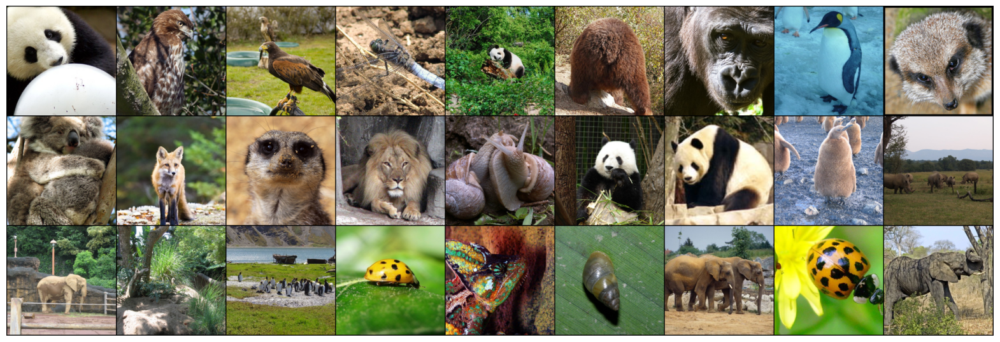

In [36]:
sample_inputs, _ = next(iter(loader_val))
fixed_input = sample_inputs[:27, :, :, :]

img = make_grid(denorm(fixed_input), nrow=9, padding=2, normalize=False,
                value_range=None, scale_each=False, pad_value=0)
plt.figure(figsize=(20,10))
plt.axis('off')
show(img)

Next, we define ResNet-18:

In [37]:
# define resnet building blocks

class ResidualBlock(nn.Module): 
    def __init__(self, inchannel, outchannel, stride=1): 
        
        super(ResidualBlock, self).__init__() 
        
        self.left = nn.Sequential(Conv2d(inchannel, outchannel, kernel_size=3, 
                                         stride=stride, padding=1, bias=False), 
                                  nn.BatchNorm2d(outchannel), 
                                  nn.ReLU(inplace=True), 
                                  Conv2d(outchannel, outchannel, kernel_size=3, 
                                         stride=1, padding=1, bias=False), 
                                  nn.BatchNorm2d(outchannel)) 
        
        self.shortcut = nn.Sequential() 
        
        if stride != 1 or inchannel != outchannel: 
            
            self.shortcut = nn.Sequential(Conv2d(inchannel, outchannel, 
                                                 kernel_size=1, stride=stride, 
                                                 padding = 0, bias=False), 
                                          nn.BatchNorm2d(outchannel) ) 
            
    def forward(self, x): 
        
        out = self.left(x) 
        
        out += self.shortcut(x) 
        
        out = F.relu(out) 
        
        return out


    
# define resnet

class ResNet(nn.Module):
    
    def __init__(self, ResidualBlock, num_classes = 20):
        
        super(ResNet, self).__init__()
        
        self.inchannel = 16
        self.conv1 = nn.Sequential(Conv2d(3, 16, kernel_size = 3, stride = 1,
                                            padding = 1, bias = False), 
                                  nn.BatchNorm2d(16), 
                                  nn.ReLU())
        
        self.layer1 = self.make_layer(ResidualBlock, 16, 2, stride = 2)
        self.layer2 = self.make_layer(ResidualBlock, 32, 2, stride = 2)
        self.layer3 = self.make_layer(ResidualBlock, 64, 2, stride = 2)
        self.layer4 = self.make_layer(ResidualBlock, 128, 2, stride = 2)
        self.layer5 = self.make_layer(ResidualBlock, 256, 2, stride = 2)
        self.layer6 = self.make_layer(ResidualBlock, 512, 2, stride = 2)
        self.maxpool = MaxPool2d(4)
        self.fc = nn.Linear(512, num_classes)
        
    
    def make_layer(self, block, channels, num_blocks, stride):
        
        strides = [stride] + [1] * (num_blocks - 1)
        
        layers = []
        
        for stride in strides:
            
            layers.append(block(self.inchannel, channels, stride))
            
            self.inchannel = channels
            
        return nn.Sequential(*layers)
    
    
    def forward(self, x):
        
        x = self.conv1(x)
        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)
        x = self.layer5(x)
        x = self.layer6(x)
        x = self.maxpool(x)
        x = x.view(x.size(0), -1)
        x = self.fc(x)
        return x
    
# please do not change the name of this class
def MyResNet():
    return ResNet(ResidualBlock)

In [38]:
from sklearn.metrics import confusion_matrix
import seaborn as sns


def confusion(preds, y):
  labels = ['African Elephant', 'Kingfisher', 'Deer','Brown Bear', 'Chameleon', 'Dragonfly',
    'Giant Panda', 'Gorilla', 'Hawk', 'King Penguin', 'Koala', 'Ladybug', 'Lion',
    'Meerkat', 'Orangutan', 'Peacock', 'Red Fox', 'Snail', 'Tiger', 'White Rhino']
  # Plotting the confusion matrix
  cm = confusion_matrix(y.cpu().numpy(), preds.cpu().numpy(), normalize='true')
  fig, ax= plt.subplots(1, 1, figsize=(15,10))
  sns.heatmap(cm, annot=True, ax = ax); #annot=True to annotate cells

  # labels, title and ticks
  ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
  ax.set_title('Confusion Matrix');
  ax.xaxis.set_ticklabels(labels, rotation = 70); ax.yaxis.set_ticklabels(labels, rotation=0);
  plt.show()

def incorrect_preds(preds, y, test_img):
  labels = ['African Elephant', 'Kingfisher', 'Deer','Brown Bear', 'Chameleon', 'Dragonfly',
    'Giant Panda', 'Gorilla', 'Hawk', 'King Penguin', 'Koala', 'Ladybug', 'Lion',
    'Meerkat', 'Orangutan', 'Peacock', 'Red Fox', 'Snail', 'Tiger', 'White Rhino']
  # lets see a sample of the images which were classified incorrectly!
  correct = (preds == y).float()
  test_labels_check = correct.cpu().numpy()
  incorrect_indexes = np.where(test_labels_check == 0)

  test_img = test_img.cpu()
  samples = make_grid(denorm(test_img[incorrect_indexes][:9]), nrow=3,
                      padding=2, normalize=False, value_range=None, 
                      scale_each=False, pad_value=0)
  plt.figure(figsize = (20,10))
  plt.title('Incorrectly Classified Instances')
  show(samples)
  labels = np.asarray(labels)
  print('Predicted label',labels[preds[incorrect_indexes].cpu().numpy()[:9]])
  print('True label', labels[y[incorrect_indexes].cpu().numpy()[:9]])
  print('Corresponding images are shown below')

In [39]:
USE_GPU = True
dtype = torch.float32 


# if USE_GPU and torch.backends.mps.is_available():
#     device = torch.device("mps")
# else:
#     device = torch.device('cpu')


if USE_GPU and torch.cuda.is_available():
    device = torch.device('cuda:0')
else:
    device = torch.device('cpu')

print(device)
    

print_every = 20
def check_accuracy(loader, model, analysis=False):
    # function for test accuracy on validation and test set
    
    num_correct = 0
    num_samples = 0
    model.eval()  # set model to evaluation mode
    with torch.no_grad():
        for t, (x, y) in enumerate(loader):
            x = x.to(device=device, dtype=dtype)  # move to device
            y = y.to(device=device, dtype=torch.long)
            scores = model(x)
            _, preds = scores.max(1)
            num_correct += (preds == y).sum()
            num_samples += preds.size(0)
            if t == 0 and analysis:
              stack_labels = y
              stack_predicts = preds
            elif analysis:
              stack_labels = torch.cat([stack_labels, y], 0)
              stack_predicts = torch.cat([stack_predicts, preds], 0)
        acc = float(num_correct) / num_samples
        print('Got %d / %d correct of val set (%.2f)' % (num_correct, num_samples, 100 * acc))
        if analysis:
          print('check acc', type(stack_predicts), type(stack_labels))
          confusion(stack_predicts, stack_labels)
          incorrect_preds(preds, y, x)
        return float(acc)

        

def train_part(model, optimizer, epochs=1):
    """
    Train a model on NaturalImageNet using the PyTorch Module API.
    
    Inputs:
    - model: A PyTorch Module giving the model to train.
    - optimizer: An Optimizer object we will use to train the model
    - epochs: (Optional) A Python integer giving the number of epochs to train for
    
    Returns: Nothing, but prints model accuracies during training.
    """
    model = model.to(device=device)  # move the model parameters to CPU/GPU
    for e in range(epochs):
        for t, (x, y) in enumerate(loader_train):
            model.train()  # put model to training mode
            x = x.to(device=device, dtype=dtype)  # move to device, e.g. GPU
            y = y.to(device=device, dtype=torch.long)

            scores = model(x)
            loss = F.cross_entropy(scores, y)

            # Zero out all of the gradients for the variables which the optimizer
            # will update.
            optimizer.zero_grad()

            loss.backward()

            # Update the parameters of the model using the gradients
            optimizer.step()

            if t % print_every == 0:
                print('Epoch: %d, Iteration %d, loss = %.4f' % (e, t, loss.item()))
        check_accuracy(loader_val, model)
                

cuda:0


The 3 cells below show the results where no hyperparameter tuning is carried out (Baseline model)

Total number of parameters is: 11204164
Epoch: 0, Iteration 0, loss = 4.1646
Epoch: 0, Iteration 20, loss = 2.9218
Epoch: 0, Iteration 40, loss = 2.8210
Epoch: 0, Iteration 60, loss = 2.4286
Epoch: 0, Iteration 80, loss = 2.5875
Epoch: 0, Iteration 100, loss = 2.5924
Epoch: 0, Iteration 120, loss = 2.3161
Epoch: 0, Iteration 140, loss = 2.3887
Got 561 / 1998 correct of val set (28.08)
Epoch: 1, Iteration 0, loss = 2.2980
Epoch: 1, Iteration 20, loss = 2.1251
Epoch: 1, Iteration 40, loss = 1.9711
Epoch: 1, Iteration 60, loss = 2.0179
Epoch: 1, Iteration 80, loss = 2.0496
Epoch: 1, Iteration 100, loss = 1.7900
Epoch: 1, Iteration 120, loss = 2.0721
Epoch: 1, Iteration 140, loss = 1.9746
Got 667 / 1998 correct of val set (33.38)
Epoch: 2, Iteration 0, loss = 1.5406
Epoch: 2, Iteration 20, loss = 1.4858
Epoch: 2, Iteration 40, loss = 1.5673
Epoch: 2, Iteration 60, loss = 1.6521
Epoch: 2, Iteration 80, loss = 1.5424
Epoch: 2, Iteration 100, loss = 1.6110
Epoch: 2, Iteration 120, loss = 1.51

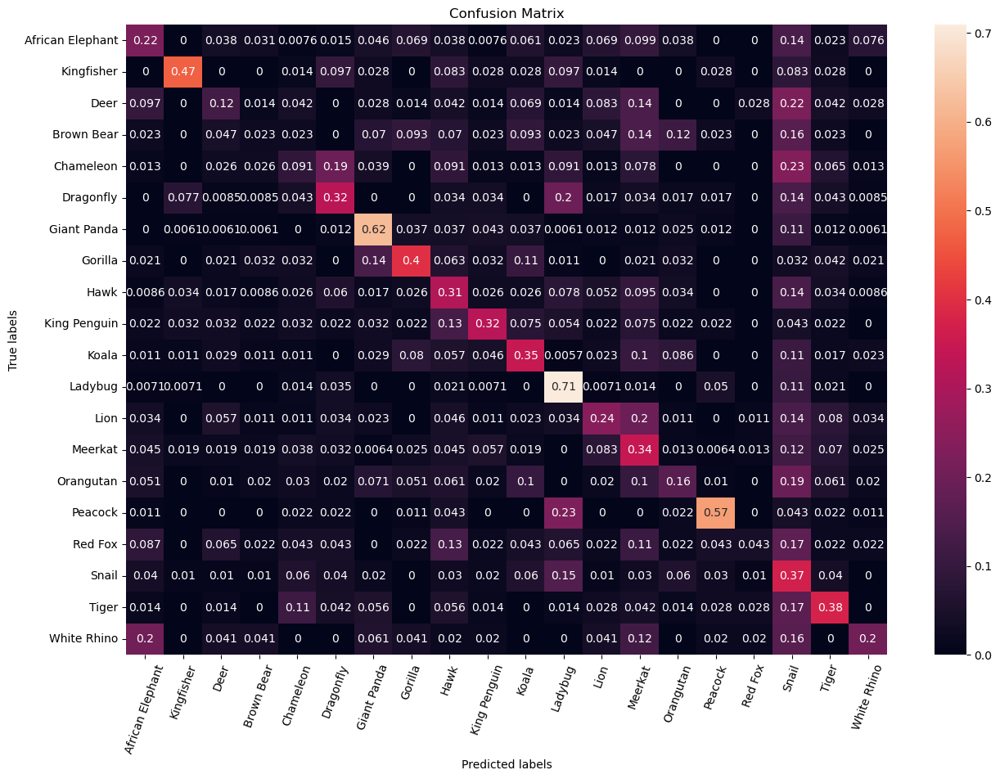

Predicted label ['Ladybug' 'Tiger' 'Meerkat' 'Red Fox' 'Giant Panda' 'Snail' 'Meerkat'
 'Chameleon' 'Snail']
True label ['King Penguin' 'Snail' 'Koala' 'Deer' 'Chameleon' 'Deer' 'King Penguin'
 'Peacock' 'Meerkat']
Corresponding images are shown below


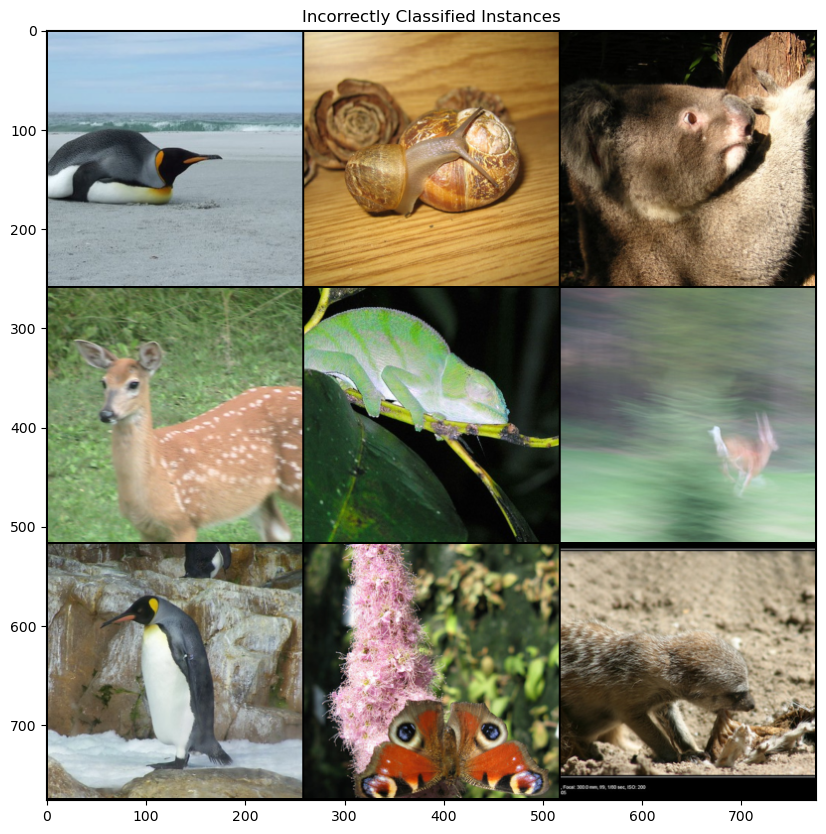

In [19]:
# define and train the network
model = MyResNet()
optimizer = optim.Adamax(model.parameters(), lr=0.0001, weight_decay=1e-7) 

params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print("Total number of parameters is: {}".format(params))

train_part(model, optimizer, epochs = 10)


# report test set accuracy
check_accuracy(loader_val, model, analysis=True)


# save the model
torch.save(model.state_dict(), 'model.pt')

Got 662 / 2000 correct of val set (33.10)
check acc <class 'torch.Tensor'> <class 'torch.Tensor'>


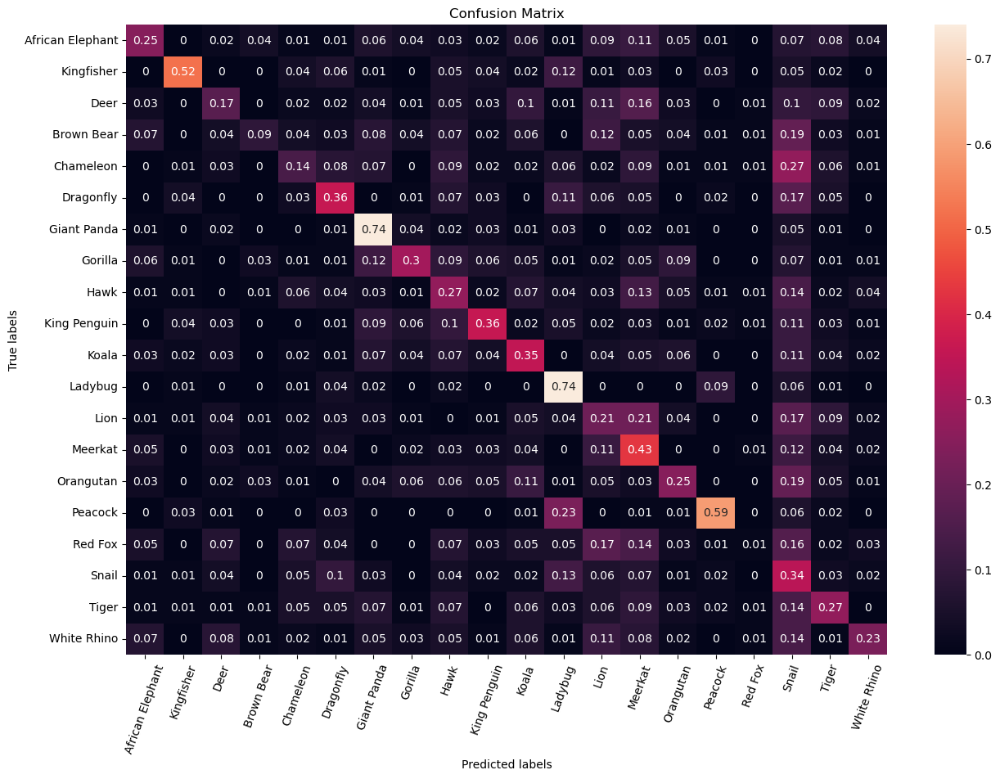

Predicted label ['King Penguin' 'Ladybug' 'Ladybug' 'Meerkat' 'Snail' 'King Penguin'
 'Lion' 'Dragonfly' 'Gorilla']
True label ['Chameleon' 'Peacock' 'Kingfisher' 'Hawk' 'Kingfisher' 'Koala'
 'White Rhino' 'Tiger' 'Brown Bear']
Corresponding images are shown below


0.331

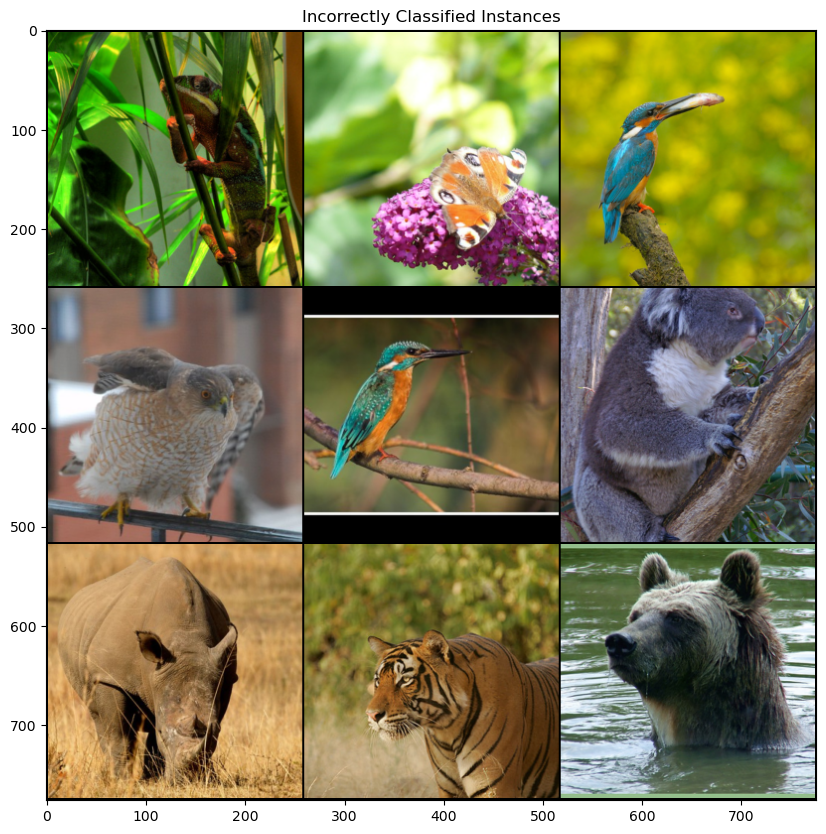

In [20]:
# Accuracy of baseline model against the test set
check_accuracy(loader_test, model, analysis=True)

## Perform Random Search here by tuning the hyper parameters of lr, dropout_weights and epoch

Total number of parameters is: 11204164
lr_decay: 0.2 weight_decay: 1e-06 epochs: 15 lr: 0.001
Epoch: 0, Iteration 0, loss = 5.5327
Epoch: 0, Iteration 20, loss = 3.2715
Epoch: 0, Iteration 40, loss = 2.6104
Epoch: 0, Iteration 60, loss = 2.6182
Epoch: 0, Iteration 80, loss = 2.5628
Epoch: 0, Iteration 100, loss = 2.5343
Epoch: 0, Iteration 120, loss = 2.2294
Epoch: 0, Iteration 140, loss = 2.3269
Got 723 / 1998 correct of val set (36.19)
Epoch: 1, Iteration 0, loss = 2.1332
Epoch: 1, Iteration 20, loss = 2.0771
Epoch: 1, Iteration 40, loss = 1.8484
Epoch: 1, Iteration 60, loss = 1.9955
Epoch: 1, Iteration 80, loss = 1.8593
Epoch: 1, Iteration 100, loss = 1.5904
Epoch: 1, Iteration 120, loss = 1.7024
Epoch: 1, Iteration 140, loss = 1.5024
Got 887 / 1998 correct of val set (44.39)
Epoch: 2, Iteration 0, loss = 1.5846
Epoch: 2, Iteration 20, loss = 1.7817
Epoch: 2, Iteration 40, loss = 1.3342
Epoch: 2, Iteration 60, loss = 1.4013
Epoch: 2, Iteration 80, loss = 1.7458
Epoch: 2, Iteration 

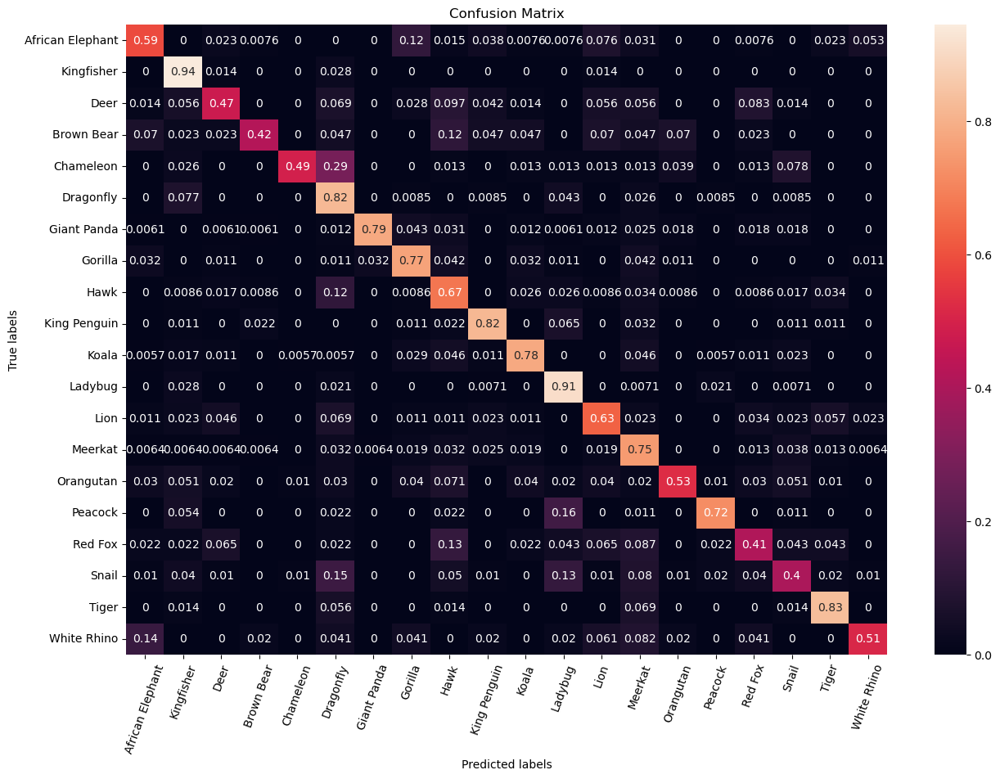

Predicted label ['Kingfisher' 'White Rhino' 'Dragonfly' 'Red Fox' 'Dragonfly' 'Peacock'
 'Meerkat' 'Dragonfly' 'Chameleon']
True label ['Dragonfly' 'African Elephant' 'Snail' 'Lion' 'Deer' 'Ladybug' 'Gorilla'
 'White Rhino' 'Koala']
Corresponding images are shown below
Accuracy:  0.6941941941941941
Best hyperparameters: lr_decay = 0.2, weight decay = 1e-06, epochs = 15, lr = 0.001
Best accuracy: 69.42%


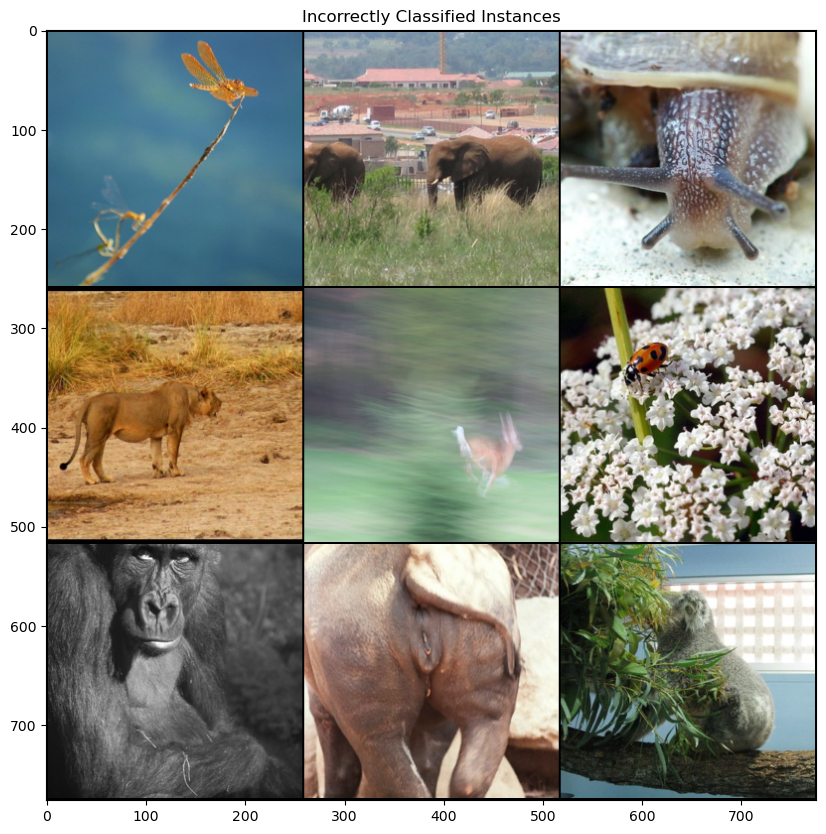

In [41]:
import random

# Define the number of random combinations to try
num_combinations = 1

# Initial range of values for hyper parameter tuning
lr_decay_range = [0.1, 0.2, 0.3, 0.5]
weight_decay_range = [1e-8, 1e-7, 1e-6, 1e-5]
epoch_range = [6, 8, 10, 15, 20]
lr_range = [0.0001, 0.001, 0.01, 0.1]

# # Initialise the parameters
# best_accuracy = 0.0
# best_lr_decay = 0.0
# best_weight_decay = 0.0
# best_epochs = 0
# best_model = None

for _ in range(num_combinations):
    # Randomly select lr, weight decay, and epochs values from the defined ranges
    lr_decay = 0.2
    weight_decay = 1e-6
    epochs = 15
    lr = 0.001
    # Randomly select lr_decay, weight decay, and epochs values from the defined ranges
    # lr_decay = random.choice(lr_decay_range)
    # weight_decay = random.choice(weight_decay_range)
    # epochs = random.choice(epoch_range)
    # lr = random.choice(lr_range)

    # Define and train the network
    model = MyResNet()
    optimizer = optim.Adam(model.parameters(), lr=lr)
    scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=1, gamma=lr_decay)

    params = sum(p.numel() for p in model.parameters() if p.requires_grad)
    print("Total number of parameters is: {}".format(params))
    print("lr_decay:", lr_decay, "weight_decay:", weight_decay, "epochs:", epochs, "lr:", lr)
          
    train_part(model, optimizer, epochs=epochs)

    # Report test set accuracy
    accuracy = check_accuracy(loader_val, model, analysis=True)
    print("Accuracy: ", accuracy)

    # Check if current hyperparameters yield better accuracy
    if accuracy > best_accuracy:
        best_accuracy = accuracy
        best_lr_decay = lr_decay
        best_weight_decay = weight_decay
        best_epochs = epochs
        best_model = model

# Print the best hyperparameters
print("Best hyperparameters: lr_decay = {}, weight decay = {}, epochs = {}, lr = {}".format(best_lr_decay, best_weight_decay, best_epochs, lr))
formatted_accuracy = "{:.2%}".format(best_accuracy)
print("Best accuracy:", formatted_accuracy)


# Save the best model
torch.save(best_model.state_dict(), 'best_model.pt')

---

<!-- BEGIN QUESTION -->

### Network Performance

Run the code below when all engineering decisions have been made, do not overfit to the test set!

**Note that** this will appear in the output, and be checked by markers (so ensure it is present in the auto-export)

Got 1338 / 2000 correct of val set (66.90)
check acc <class 'torch.Tensor'> <class 'torch.Tensor'>


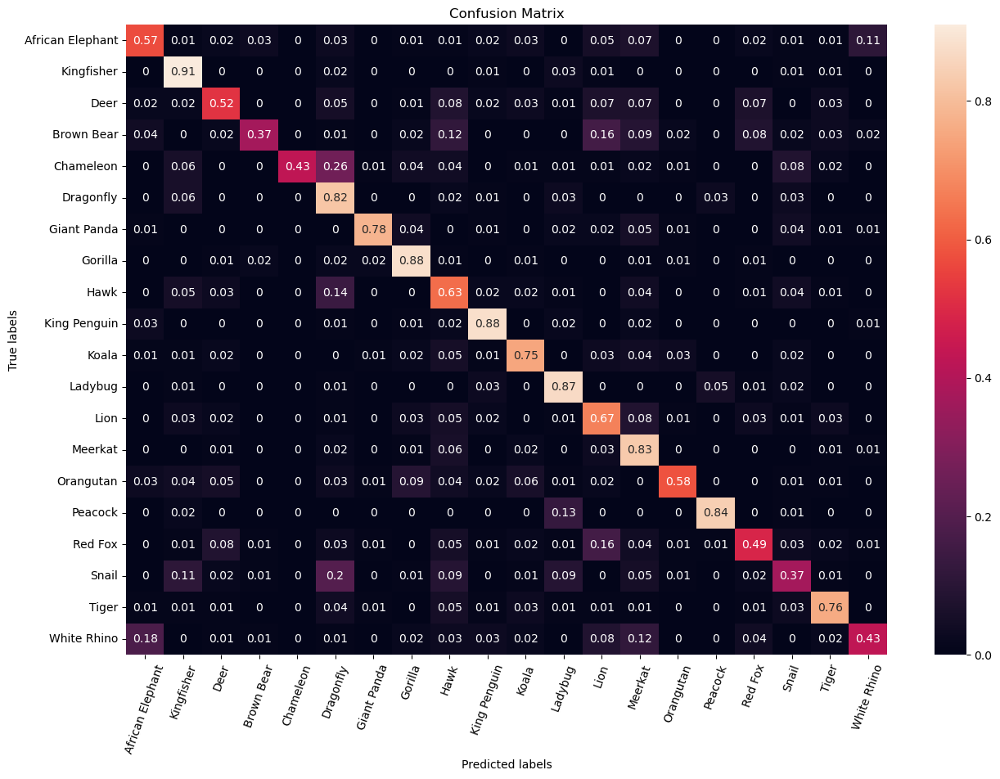

Predicted label ['White Rhino' 'Dragonfly' 'Hawk' 'Dragonfly' 'Kingfisher' 'Giant Panda'
 'Dragonfly' 'Deer' 'Meerkat']
True label ['African Elephant' 'Snail' 'Tiger' 'White Rhino' 'Tiger' 'Gorilla'
 'Snail' 'Hawk' 'Lion']
Corresponding images are shown below


0.669

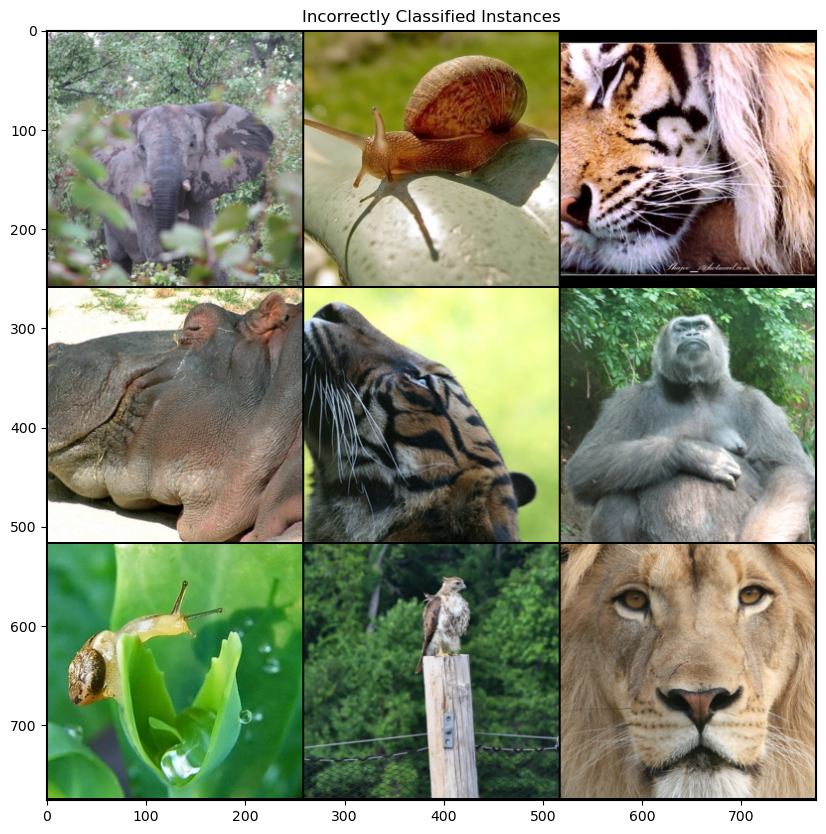

In [43]:
check_accuracy(loader_test, best_model, analysis=True)

___

<!-- END QUESTION -->

<!-- BEGIN QUESTION -->

### Q2.1: Hyperparameter Search:
Given such a network with a large number of trainable parameters, and a training set of a large number of data, what do you think is the best strategy for hyperparameter searching? (3 points)

**Answer:**

Ideally we want to perform a grid search. It is a brute force approach where we test all the possible combination of of different hyperparameters in the hyperparameter set give. But since gridsearch is too resource intensive, it takes up too much time, memory and gpu power to be effective and useful in this module. 

We would instead utilise random search. A random search is done by tuning the hyper parameters of learning rate, epoch and dropout rates.

---

<!-- END QUESTION -->

<!-- BEGIN QUESTION -->

### Q2.2: Engineering Decisions 

Detail which engineering decisions you made to boost the performance of the baseline results. Why do you think that they helped? (7 points)

**Answer:**

In order to save time, i used a random search tuning the parameters of :
1. lr_decay_range = [0.1, 0.2, 0.3, 0.5]
2. weight_decay_range = [1e-8, 1e-7, 1e-6, 1e-5]
3. epoch_range = [6, 8, 10, 15, 20]
4. lr_range = [0.0001, 0.001, 0.01, 0.1]
4. I limited the number of combinations to only 10 random combinations due to resource constrains.


The following parameters were chosen because of the following reasons:
1. Learning Rate: Controls how quickly the model learns and adjusts its parameters. It affects convergence speed and stability.
2. Learning Rate Decay: Gradually reduce LR over time to help converge more smoothly and gradually as the model converges on an optimised solution
3. Weight Decay: Helps prevent overfitting by adding a penalty for large weight values. It balances between reducing overfitting and maintaining generalization.
4. Number of Epochs: Determines the number of times the model is exposed to the training data. It ensures the model learns effectively without underfitting or overfitting.

**Initial Steps taken:**
Initially I ran 10 random combinations and permutations but they all resulted in poor results, there was a large range of accuracy scores from 20% to 50% some even lower than the baseline accuracy. The highest accuracy attained from the original 10 combinaitions is about 50% accuracy. 

**I made the following Obersvations:**
1. Epoch: it appears that epoch ranges from 6-8 tend to produce less accurate results while 10-12 produces more accurate results as the dataset is huge, more passes are required to allow the loss to converge to zero. 
2. Weight Decay: A lower weight decay seems to result in a higher accurate result but more likely to overfit as epoch increases.
3. Learning rate: seem to performed better amongst the range of [0.001, 0.005, 0.01]
4. lr decay seems to perform better in the lower ranges.




**Follow up Steps taken:**
In the end, i manually fine tuned the model using a smaller set of tuning parameters weight decay: [1e-7, 1e-6, 1e-5], epoch: 15, lr: [0.01, 0.1].  This eventually lead to a more accurate result in the training and test set.

**Final Results:**
Best hyperparameters: lr_decay: 0.2 weight_decay: 1e-06 epochs: 15 lr: 0.001.
Best accuracy on the train set only: 69.42%
Best accuracy on the test set: 66.90% (implies there are some overfitting)
Overall the result of the trained best model performs at 66.90% accuracy against the test model. This while it is not great, it is higher than than the baseline accuracy of 34.80%.

**Limitations:**
It seems like choosing a random sample of only 10 combination of hyper parameters is very lacking. This is even so that there are 4x4x5x4 = 320 possible combination from the set defined. There are also other hyperparameters such as dropout rate that are not tested. 

**Improvements:**
Perhaps a differnt approach such as Bayesian Optimization could be used instead. Bayesian Optimisation could potentially intelligently select hyper parameter configurations to yield better performance. However this was not done because i would need to import another library which i'm trying to refrain from doing.



<!-- END QUESTION -->

<!-- BEGIN QUESTION -->

<!-- END QUESTION -->

<!-- BEGIN QUESTION -->

### Q2.3: Out of distribution evaluation

Lets see how your trained model performs when evaluated on cartoons of the 20 animal classes. Do not try and modify your model to perform well on this task, this is just a reflective exercise. How did your model perform at the task? Why do you think this was the case? Detail one method which you expect would improve model performance. (2 points)

In [44]:
ON_COLAB = False

!wget https://zenodo.org/records/10424022/files/cartoons.zip?download=1

if ON_COLAB:
    !unzip /content/cartoons.zip?download=1 > /dev/null

else:
    !unzip cartoons.zip?download=1 > /dev/null

--2024-02-01 11:42:16--  https://zenodo.org/records/10424022/files/cartoons.zip?download=1
Resolving zenodo.org (zenodo.org)... 188.184.103.159, 188.185.79.172, 188.184.98.238, ...
Connecting to zenodo.org (zenodo.org)|188.184.103.159|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1737267 (1.7M) [application/octet-stream]
Saving to: 'cartoons.zip?download=1.1'

cartoons.zip?downlo 100%[===================>]   1.66M  2.37MB/s    in 0.7s    

2024-02-01 11:42:18 (2.37 MB/s) - 'cartoons.zip?download=1.1' saved [1737267/1737267]

replace cartoons/.DS_Store? [y]es, [n]o, [A]ll, [N]one, [r]ename: ^C


In [51]:
mean = torch.Tensor([0.485, 0.456, 0.406]) # assuming same dist as imagenet
std = torch.Tensor([0.229, 0.224, 0.225])
transform = transforms.Compose(
        [
            transforms.Resize(256),
            transforms.CenterCrop(256),
            transforms.ToTensor(),
            transforms.Normalize(mean.tolist(), std.tolist()),
        ]

    )
cartoon_path = ('/content/' if ON_COLAB else '') + 'cartoons'


cartoon_dataset = datasets.ImageFolder(cartoon_path, transform=transform)

print(len(cartoon_dataset))

batch_size = 128

cartoon_loader = DataLoader(cartoon_dataset, batch_size=batch_size, shuffle=True, num_workers=2)

400


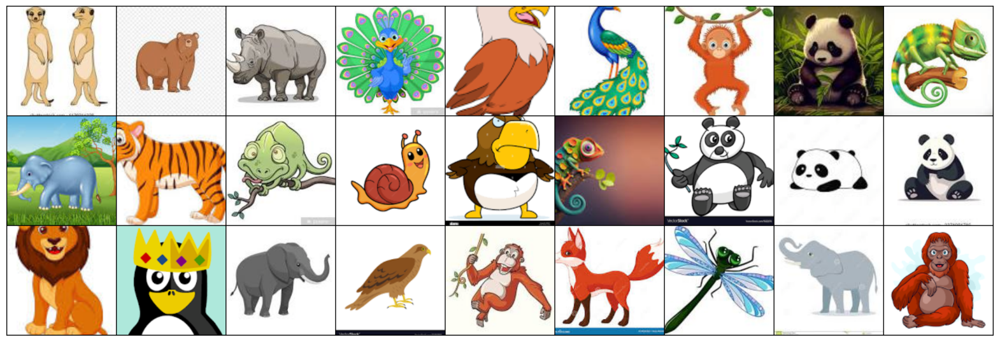

In [52]:
sample_inputs, _ = next(iter(cartoon_loader))
fixed_input = sample_inputs[:27, :, :, :]

img = make_grid(denorm(fixed_input), nrow=9, padding=2, normalize=False,
                value_range=None, scale_each=False, pad_value=0)

plt.figure(figsize=(20,10))
plt.axis('off')
show(img)

Got 85 / 400 correct of val set (21.25)
check acc <class 'torch.Tensor'> <class 'torch.Tensor'>


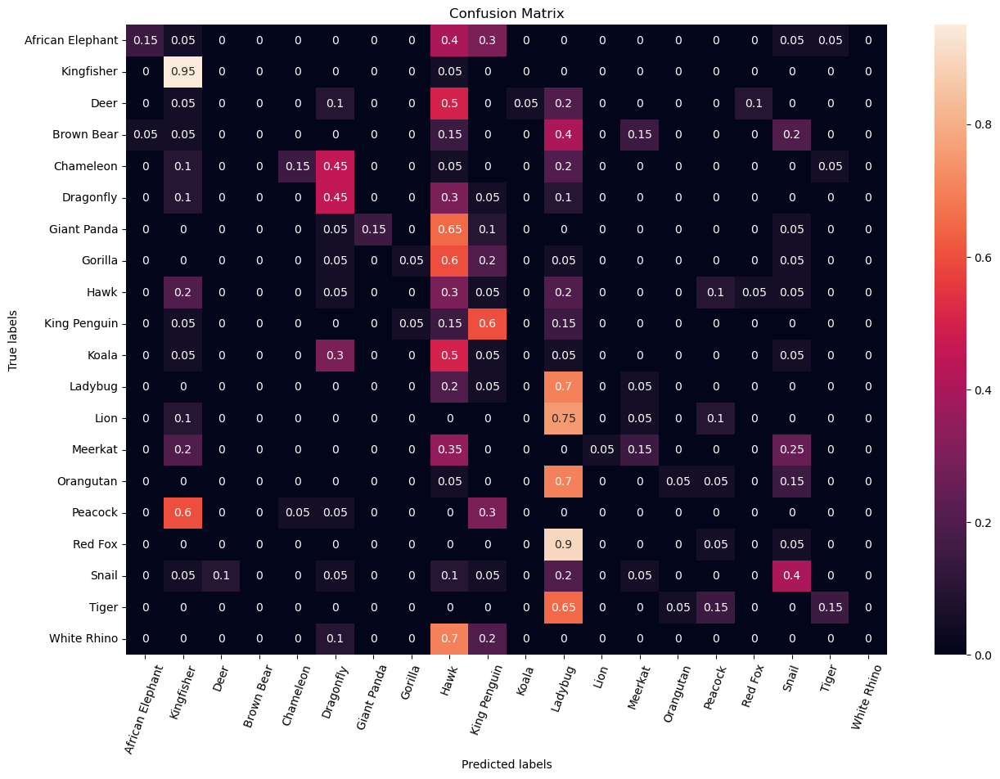

Predicted label ['Dragonfly' 'Ladybug' 'Kingfisher' 'Ladybug' 'Dragonfly' 'Hawk' 'Hawk'
 'Hawk' 'Dragonfly']
True label ['Koala' 'Snail' 'Hawk' 'Lion' 'Koala' 'Koala' 'White Rhino' 'Giant Panda'
 'Chameleon']
Corresponding images are shown below


0.2125

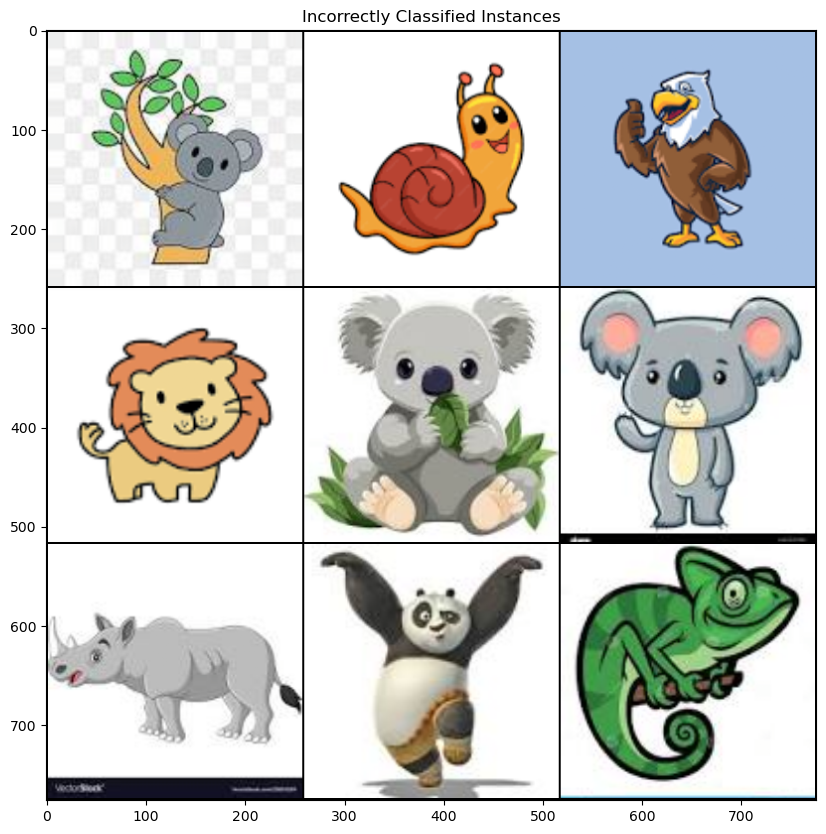

In [53]:
check_accuracy(cartoon_loader, best_model, analysis=True)

**Answer:**

The model performed badly. This may be because the original CNN model was trained to observe real animals in real environments, and it may not have learned the specific features and characteristics of cartoon animal drawings.

One method that could potentially improve the model's performance in this task is data augmentation. By augmenting the training data with transformed versions of the original images, the model can learn to generalize better. Some augmentation could include Stylization filter on the cartoon image to make it look more real life 



<!-- END QUESTION -->

## Part 3 (10 points)

The code provided below will allow you to visualise the feature maps computed by different layers of your network. Run the code (install matplotlib if necessary) and **answer the following questions*(: 

<!-- BEGIN QUESTION -->

### Q3.1 : Learned Features

Compare the feature maps from low-level layers to high-level layers, what do you observe? (4 points)

**Answer:**

In the low level layers, simple structures can be seen after the convolution. Some simple features such as lines, contours, corners and edges can be seen. High-intensity regions can also be observerd.

As the layers get deeper, the feature map becomes more abstract and complex. This abstraction is built upon the previous lower levels. These features eventually get big enough that they might represent objects and shapes but from the content of the images obersved, it is difficult to recognise these patterns other than blobs of colours. 

---

<!-- END QUESTION -->

<!-- BEGIN QUESTION -->

### Q3.2: Performance Analysis

Use the training log, reported test set accuracy and the feature maps, analyse the performance of your network. If you think the performance is sufficiently good, explain why; if not, what might be the problem and how can you improve the performance? (4 points)

**Answer:**

I think my performance is not great. My final accuracy score is only 67.20% against the test set.
During random earch, i get a random accuracy ranging from 20% to 70%. 20-30% indicates that the model is functioning worse than baseline. As the final accuracy score is only 67.20% against the test set, despite a training accuracy of 71.92%, it also shows that my model is slightly overfitted.

One possible reason to this is there are multiple hyper-parameter combinations that i have not tested out as well. I could also adjust the hyper parameter to reduce overfitting.

Some additional things i can do to improve the performance:
1) Get more traing data
2) Increase the weight_decay to prevent overfitting
3) Implement Dropout regularisation to the model from relying too heavily on specific inputs.
4) Edit the code to allow for Early stoppage once signs of over fitting is observed. (right now the code needs to run all epoches before the model is evaluated) 
5) Decrease the learning rate to slow down the rate at which the model adapts to the training data
6) Simulatneously increasing epoch layer 
7) Time and computational power

Ultimately, these will require more time.

---

<!-- END QUESTION -->

<!-- BEGIN QUESTION -->

### Q3.3: Alternative Evaluations

What are the other possible ways to analyse the performance of your network? (2 points)

**Answer:**

1. Potentially use precision, recall or F1 scores. Could compare the precision and recall of each class to analyse the performance of tghe model.
2. Perform cross validation by splitting the data into multiple folds and evaluate the performance on each fold. But this will take time.

---

<!-- END QUESTION -->

**Feature Visualization**

The code below will visualize the features of your network layers (you may need to modify the layer names if you made changes to your architecture). 

If you change the plotting code, please ensure it still exports correctly when running the submission cell.

In [54]:
import matplotlib.pyplot as plt

def plot_model_features():
    fig = plt.tight_layout()
    activation = {}
    def get_activation(name):
        def hook(best_model, input, output):
            activation[name] = output.detach()
        return hook
    vis_labels = ['conv1', 'layer1', 'layer2', 'layer3', 'layer4', 'layer5', 'layer6']

    for l in vis_labels:
        getattr(best_model, l).register_forward_hook(get_activation(l))
        

    data, _ = test_dataset[999]
    data = data.unsqueeze_(0).to(device = device, dtype = dtype)
    output = best_model(data)

    for idx, l in enumerate(vis_labels):
        act = activation[l].squeeze()

        # only showing the first 16 channels
        ncols, nrows = 8, 2
        
        fig, axarr = plt.subplots(nrows, ncols, figsize=(15,5))
        fig.suptitle(l)

        count = 0
        for i in range(nrows):
            for j in range(ncols):
                axarr[i, j].imshow(act[count].cpu())
                axarr[i, j].axis('off')
                count += 1

<!-- BEGIN QUESTION -->



<Figure size 640x480 with 0 Axes>

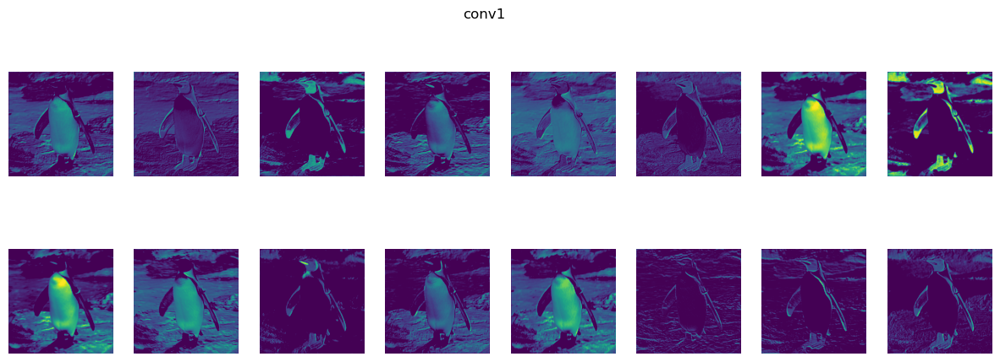

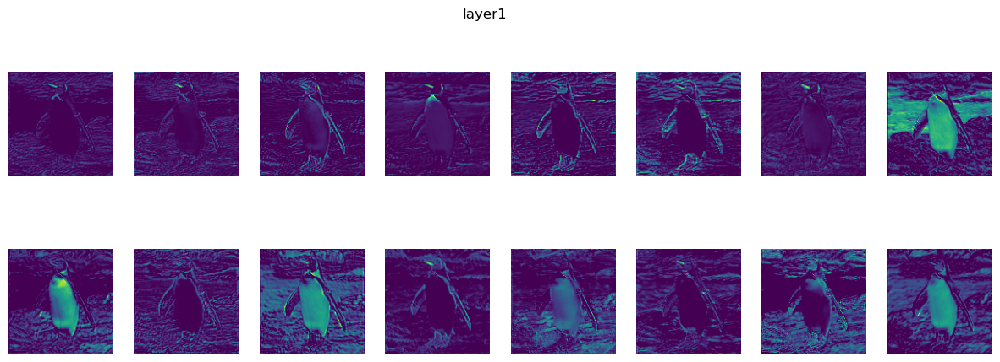

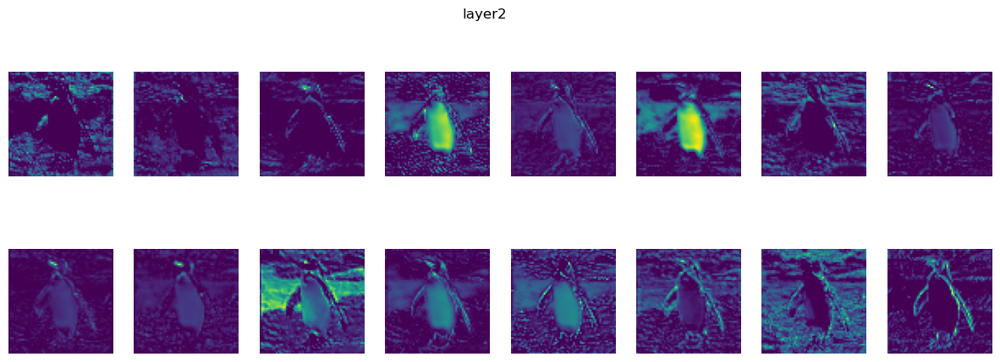

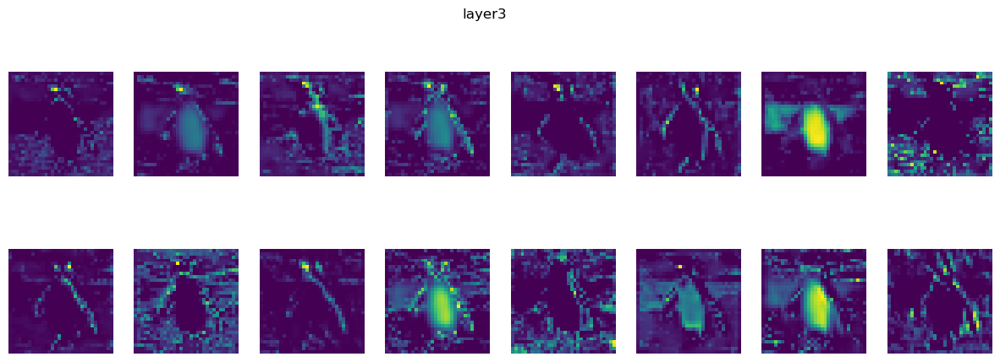

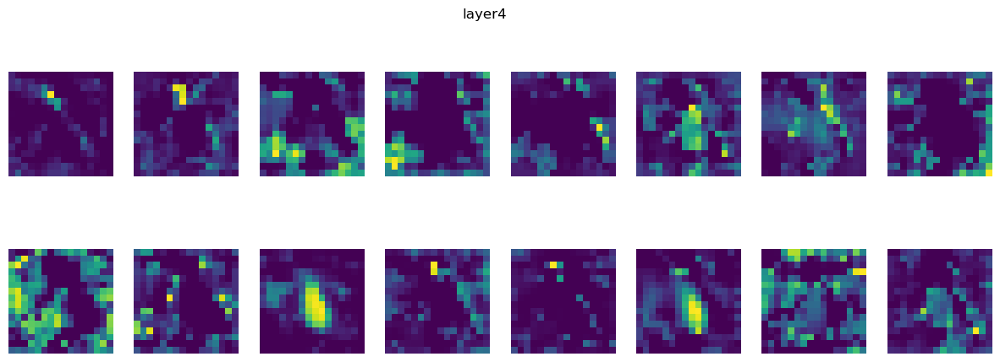

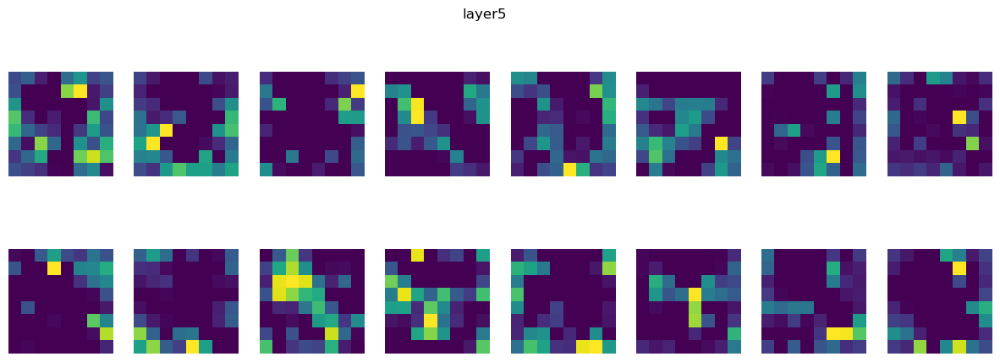

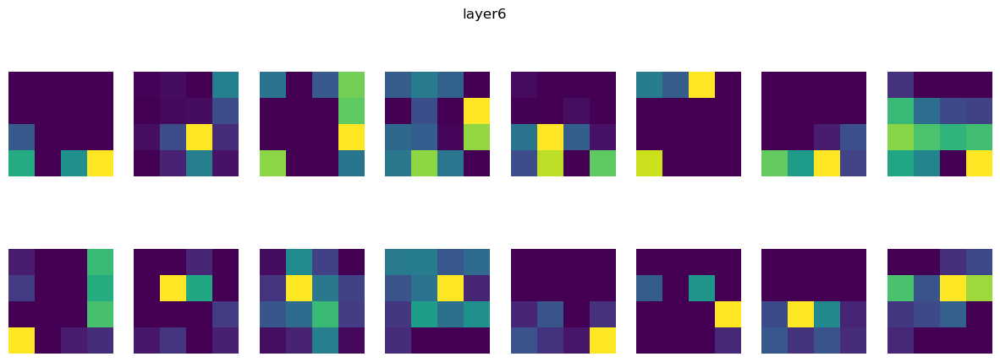

In [55]:
# Visualize the figure here, so it is exported nicely
plot_model_features()  

<!-- END QUESTION -->

## Submission
Git push your finalized version of this notebook (with saved outputs) to the gitlab repo which you were assigned. You should request our tests once and check that the ```preview.pdf```:
* Passes all public tests (these are the same ones provided / embedded in the notebook itself)
* Contains your qualitative answers
* Contains your figures (confusion matrix and network features)

---

To double-check your work, the cell below will rerun all of the autograder tests.

In [59]:
grader.check_all()

BatchNorm Layer results: All test cases passed!
BatchNorm Layer - 1 message: Shape Test Passed
BatchNorm Layer - 2 message: Type Test Passed
BatchNorm Layer - 3 message: Param Name Test Passed
BatchNorm Layer - 4 message: Param Shape Test Passed

Convolution Layer results: All test cases passed!
Convolution Layer - 1 message: Shape Test Passed
Convolution Layer - 2 message: Type Test Passed
Convolution Layer - 3 message: Param Name Test Passed
Convolution Layer - 4 message: Param Shape Test Passed

Linear Layer results: All test cases passed!
Linear Layer - 1 message: Shape Test Passed
Linear Layer - 2 message: Type Test Passed
Linear Layer - 3 message: Param Name Test Passed
Linear Layer - 4 message: Param Shape Test Passed

MaxPool Layer results: All test cases passed!
MaxPool Layer - 1 message: Shape Test Passed
MaxPool Layer - 2 message: Type Test Passed